# 모델 학습 실험 3
노이즈 주입에 따른 드리프트 분석 및 모델 추론 성능 비교<br>
* ref : 원본 이미지
* cur : ref + 일정 수준의 노이즈
* test : ref + 무작위 수준의 노이즈


## 데이터 준비
데이터셋 노이즈 주입 및 복제

### 전체 데이터 형상

In [1]:
import os

print(os.getcwd())

/home/ethicsense/dev/datadrift_app_engine/notebooks


In [2]:
import os

data_dir = "../datasets"
files = os.listdir(data_dir)

for file in files:
    print(file)


tunelpdr_merged_all.zip
tunelpdr_merged_all
uploads


In [3]:
data_path = os.path.join(data_dir, files[1])
print(data_path)

../datasets/tunelpdr_merged_all


In [4]:
os.listdir(data_path)

['images', 'labels', 'dataset.yaml']

In [6]:
img_path = os.path.join(data_path, "images")
splits = os.listdir(img_path)

print(splits)

['train', 'val', 'test']


In [7]:
total_files = 0

for subdir in splits:
    subdir_path = os.path.join(img_path, subdir)
    files_count = len(os.listdir(subdir_path))
    print(f'{subdir} 디렉터리 파일 갯수: {files_count}')
    total_files += files_count

print(f"전체 파일 갯수 : {total_files}")

train 디렉터리 파일 갯수: 8954
val 디렉터리 파일 갯수: 2558
test 디렉터리 파일 갯수: 1280
전체 파일 갯수 : 12792


### 노이즈 주입 함수

In [8]:
import cv2
import numpy as np

def add_noise(image, noise_type='gaussian', params=None):
    """
    다양한 종류의 노이즈를 추가하는 함수
    
    noise_type 옵션:
    - gaussian: 가우시안 노이즈
    - salt_and_pepper: 소금-후추 노이즈
    - poisson: 포아송 노이즈
    - speckle: 스펙클 노이즈
    - periodic: 주기적 노이즈
    - motion_blur: 모션 블러
    - jpeg_compression: JPEG 압축 노이즈
    - brightness_contrast: 밝기와 대비 조정
    """
    if params is None:
        params = {}
    
    noisy = np.copy(image)
    
    if noise_type == "gaussian":
        # 가우시안 노이즈: 정규 분포를 따르는 랜덤 노이즈
        mean = params.get('mean', 0)
        sigma = params.get('sigma', 25)
        gauss = np.random.normal(mean, sigma, image.shape)
        noisy = np.clip(image + gauss, 0, 255).astype(np.uint8)
    
    elif noise_type == "salt_and_pepper":
        # 소금-후추 노이즈: 랜덤하게 흰점과 검은점을 추가
        prob = params.get('prob', 0.05)
        rnd = np.random.random(image.shape)
        noisy[rnd < prob/2] = 0    # 후추 노이즈
        noisy[rnd > 1 - prob/2] = 255  # 소금 노이즈
    
    elif noise_type == "poisson":
        # 포아송 노이즈: 이미지 센서에서 발생하는 노이즈
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    
    elif noise_type == "speckle":
        # 스펙클 노이즈: 레이더나 초음파 이미지에서 발생하는 노이즈
        intensity = params.get('intensity', 0.1)
        gauss = np.random.normal(0, intensity, image.shape)
        noisy = np.clip(image + image * gauss, 0, 255).astype(np.uint8)
    
    elif noise_type == "periodic":
        # 주기적 노이즈: 전기적 간섭이나 센서 문제로 발생하는 주기적 패턴
        freq = params.get('freq', 0.1)
        x, y = np.meshgrid(np.arange(image.shape[1]), np.arange(image.shape[0]))
        noise = 20 * np.sin(2 * np.pi * freq * x) + 20 * np.sin(2 * np.pi * freq * y)
        noisy = np.clip(image + noise[:, :, np.newaxis], 0, 255).astype(np.uint8)
    
    elif noise_type == "motion_blur":
        # 모션 블러: 카메라나 피사체의 움직임으로 인한 블러
        size = params.get('size', 15)
        angle = params.get('angle', 45)
        kernel = np.zeros((size, size))
        kernel[int((size-1)/2), :] = np.ones(size)
        kernel = cv2.warpAffine(kernel, 
                              cv2.getRotationMatrix2D((size/2, size/2), angle, 1.0), 
                              (size, size))
        kernel = kernel / size
        noisy = cv2.filter2D(image, -1, kernel)
    
    elif noise_type == "jpeg_compression":
        # JPEG 압축 노이즈: 이미지 압축으로 인한 품질 저하
        quality = params.get('quality', 50)
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
        _, encimg = cv2.imencode('.jpg', image, encode_param)
        noisy = cv2.imdecode(encimg, 1)

    elif noise_type == "brightness_contrast":
        # 밝기와 대비 조정
        brightness = params.get('brightness', 0)  # -100 ~ 100
        contrast = params.get('contrast', 1.0)    # 0.0 ~ 3.0
        
        # 대비 조정
        noisy = cv2.convertScaleAbs(noisy, alpha=contrast, beta=brightness)
    
    return noisy

### 노이즈 주입 테스트

In [18]:
import matplotlib.pyplot as plt
import random

# 이미지 로드 (예시 이미지 경로를 적절히 수정해주세요)
sample_img_path = os.path.join(img_path, 'train')  # train 폴더의 첫 번째 이미지 사용
sample_img_file = random.choice(os.listdir(sample_img_path))
img = cv2.imread(os.path.join(sample_img_path, sample_img_file))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR을 RGB로 변환ㅋ

# 다양한 노이즈 적용
noises = {
    'Original': img,
    'Gaussian': add_noise(img, 'gaussian', {'mean': 0, 'sigma': 25}),
    'Salt & Pepper': add_noise(img, 'salt_and_pepper', {'prob': 0.05}),
    'Poisson': add_noise(img, 'poisson'),
    'Speckle': add_noise(img, 'speckle', {'intensity': 0.1}),
    'Periodic': add_noise(img, 'periodic', {'freq': 0.1}),
    'Motion Blur': add_noise(img, 'motion_blur', {'size': 15, 'angle': 45}),
    'JPEG Compression': add_noise(img, 'jpeg_compression', {'quality': 10}),
    'Bright': add_noise(img, 'brightness_contrast', {'brightness': 50, 'contrast': 1.0}),
    'Dark': add_noise(img, 'brightness_contrast', {'brightness': -50, 'contrast': 1.0}),
    'High Contrast': add_noise(img, 'brightness_contrast', {'brightness': 0, 'contrast': 1.5}),
    'Low Contrast': add_noise(img, 'brightness_contrast', {'brightness': 0, 'contrast': 0.5})
}

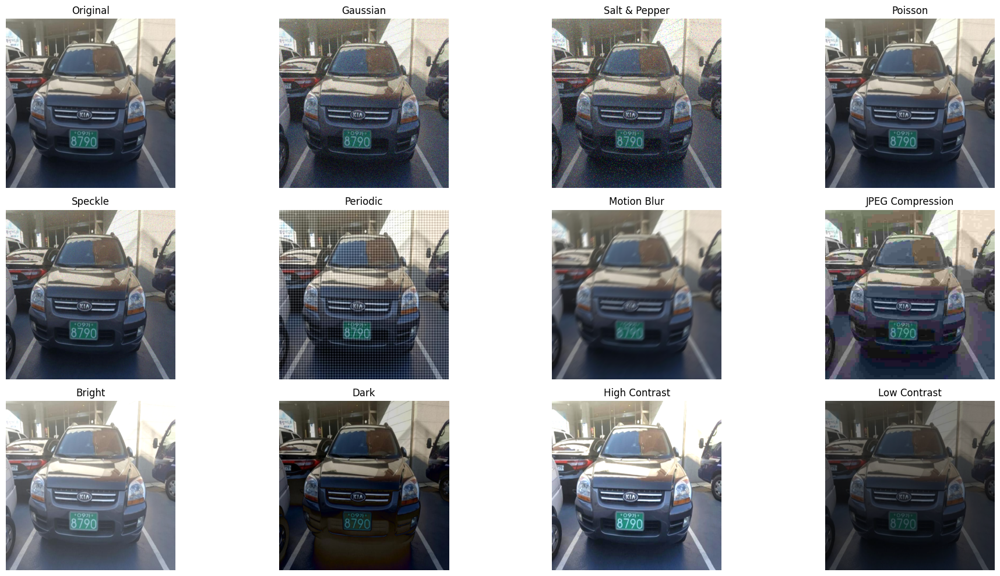

In [19]:
# 시각화
rows = 3
cols = 4  # 12개의 이미지를 3x4 그리드로 표시

plt.figure(figsize=(20, 10))

for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(noisy_img)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

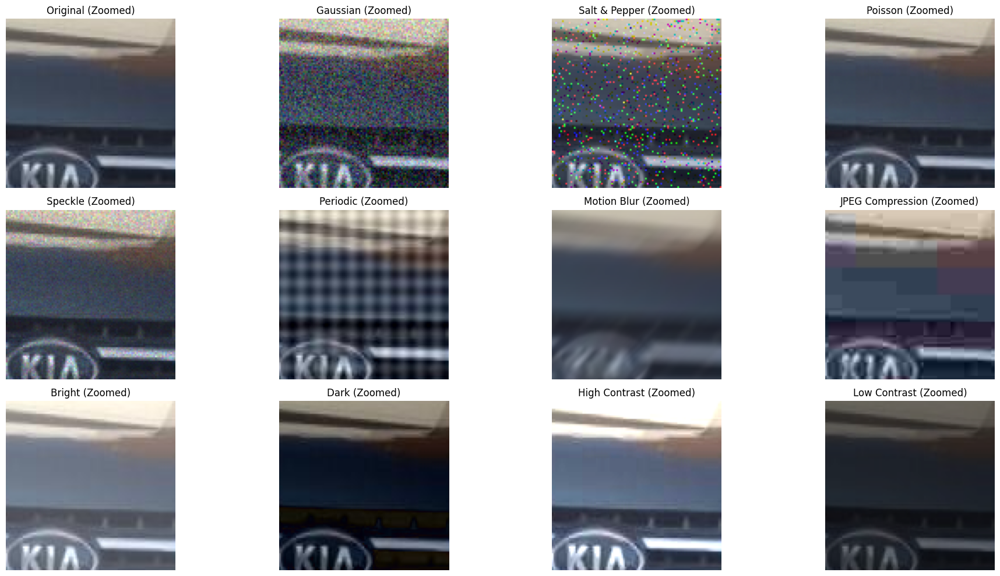

In [20]:
# 노이즈 효과를 더 자세히 보기 위해 이미지의 일부분만 확대해서 시각화
# 이미지의 중앙 부분을 크롭
h, w = img.shape[:2]
crop_size = 100
start_h = h//2 - crop_size//2
start_w = w//2 - crop_size//2

plt.figure(figsize=(20, 10))
for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    cropped = noisy_img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    plt.imshow(cropped)
    plt.title(f"{title} (Zoomed)")
    plt.axis('off')

plt.tight_layout()
plt.show()

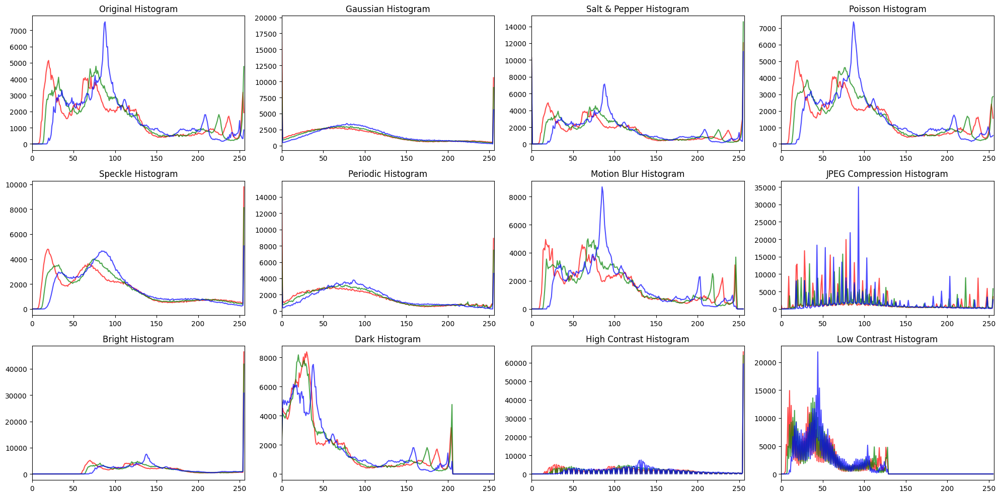

In [21]:
# 히스토그램 비교
plt.figure(figsize=(20, 10))
for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    # RGB 각 채널의 히스토그램
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([noisy_img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color, alpha=0.7)
    plt.title(f"{title} Histogram")
    plt.xlim([0, 256])
    
plt.tight_layout()
plt.show()

In [22]:
# 다양한 강도의 가우시안 노이즈 테스트
noise_levels = {
    'Original': None,  # 원본 이미지
    'Very Low (σ=5)': {'mean': 0, 'sigma': 5},
    'Low (σ=15)': {'mean': 0, 'sigma': 15},
    'Medium (σ=25)': {'mean': 0, 'sigma': 25},
    'High (σ=35)': {'mean': 0, 'sigma': 35},
    'Very High (σ=50)': {'mean': 0, 'sigma': 50}
}

# 결과 이미지 저장
result_images = {}
for title, params in noise_levels.items():
    if params is None:
        result_images[title] = img
    else:
        result_images[title] = add_noise(img, 'gaussian', params)

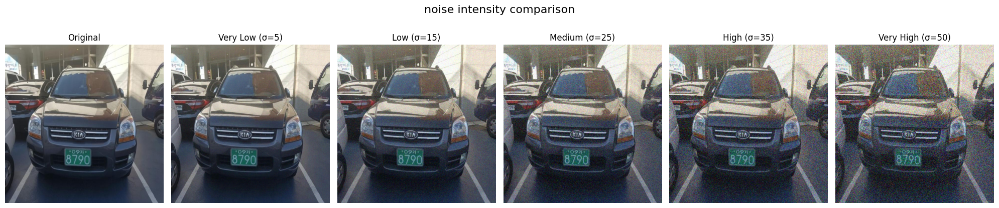

In [23]:
# 1. 전체 이미지 시각화
plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    plt.imshow(noisy_img)
    plt.title(title)
    plt.axis('off')
plt.suptitle('noise intensity comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

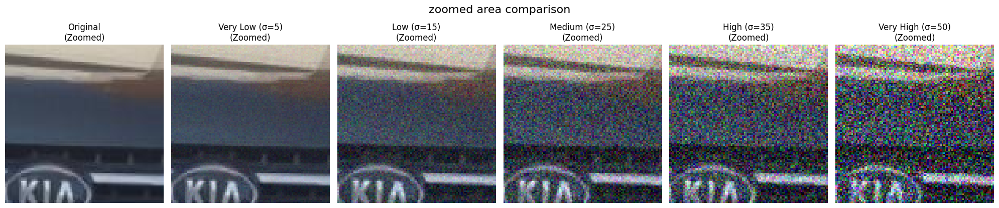

In [24]:
# 2. 확대된 부분 시각화
h, w = img.shape[:2]
crop_size = 100
start_h = h//2 - crop_size//2
start_w = w//2 - crop_size//2

plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    cropped = noisy_img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    plt.imshow(cropped)
    plt.title(f"{title}\n(Zoomed)")
    plt.axis('off')
plt.suptitle('zoomed area comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

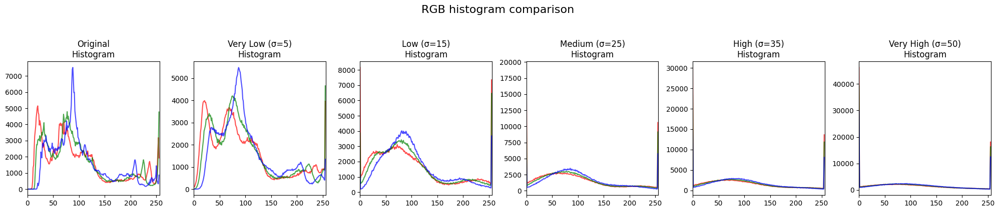

In [25]:
# 3. 히스토그램 비교
plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    # RGB 각 채널의 히스토그램
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([noisy_img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color, alpha=0.7)
    plt.title(f"{title}\nHistogram")
    plt.xlim([0, 256])
plt.suptitle('RGB histogram comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

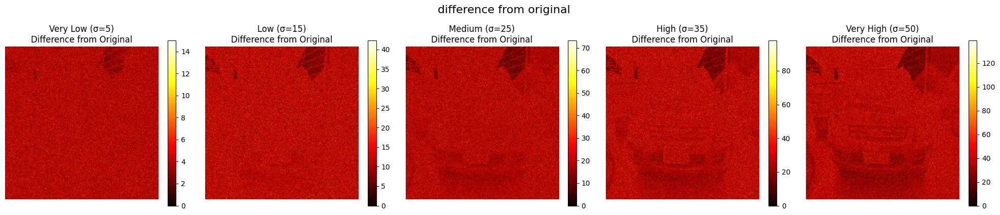

In [26]:
# 4. 픽셀값 차이 시각화 (원본과의 차이)
plt.figure(figsize=(20, 4))
original = result_images['Original']
for idx, (title, noisy_img) in enumerate(result_images.items()):
    if title == 'Original':
        continue
    plt.subplot(1, 5, idx)
    # 차이를 강조하기 위해 절대값을 취하고 스케일을 조정
    diff = np.abs(original.astype(np.float32) - noisy_img.astype(np.float32))
    diff = np.mean(diff, axis=2)  # RGB 채널의 평균
    plt.imshow(diff, cmap='hot')
    plt.colorbar()
    plt.title(f"{title}\nDifference from Original")
    plt.axis('off')
plt.suptitle('difference from original', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

### 노이즈 주입 데이터셋 생성 1
```noised_cur``` : 원본 이미지에 일정한 수준의 가우시안 노이즈 주입

In [28]:
import shutil
import tqdm

# 새로운 데이터셋 저장 경로 설정
noise_data_path = os.path.join(data_dir, "noised_cur")
noise_img_path = os.path.join(noise_data_path, "images")

# 기존 디렉토리가 있다면 삭제
if os.path.exists(noise_data_path):
    shutil.rmtree(noise_data_path)

# 디렉토리 구조 생성
os.makedirs(noise_data_path)
os.makedirs(noise_img_path)

# splits dir 생성
for subdir in splits:
    os.makedirs(os.path.join(noise_img_path, subdir))

# labels 디렉토리 복사
shutil.copytree(os.path.join(data_path, 'labels'), os.path.join(noise_data_path, 'labels'))
# dataset.yaml 파일 복사
shutil.copy2(os.path.join(data_path, 'dataset.yaml'), os.path.join(noise_data_path, 'dataset.yaml'))

# 가우시안 노이즈 파라미터 설정
noise_params = {
    'mean': 0,
    'sigma': 15  # 노이즈 강도 조절
}

# train과 val 디렉토리의 모든 이미지에 노이즈 적용
for subdir in splits:
    src_dir = os.path.join(img_path, subdir)
    dst_dir = os.path.join(noise_img_path, subdir)
    
    # 진행바 표시를 위한 tqdm 사용
    for img_file in tqdm.tqdm(os.listdir(src_dir), desc=f'Processing {subdir}'):
        # 이미지 로드
        img = cv2.imread(os.path.join(src_dir, img_file))
        
        # 노이즈 적용
        noisy_img = add_noise(img, 'gaussian', noise_params)
        
        # 노이즈가 적용된 이미지 저장
        cv2.imwrite(os.path.join(dst_dir, img_file), noisy_img)

print("노이즈가 적용된 데이터셋 생성 완료!")

Processing test: 100%|██████████| 1280/1280 [00:33<00:00, 38.06it/s]

노이즈가 적용된 데이터셋 생성 완료!


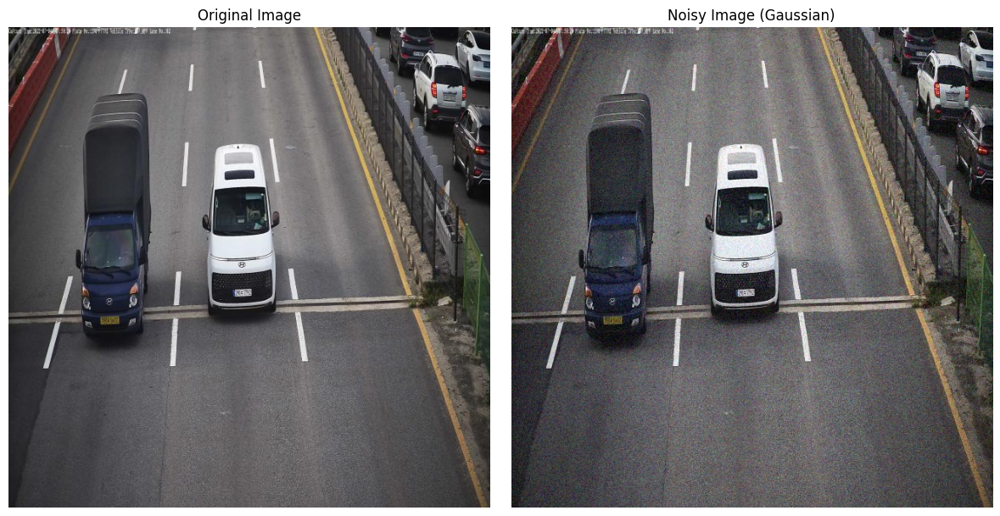

In [29]:
# 원본과 노이즈 적용 이미지 비교 시각화 (샘플)
sample_img_file = os.listdir(os.path.join(img_path, 'train'))[0]

original = cv2.imread(os.path.join(img_path, 'train', sample_img_file))
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_img_file))
noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy)
plt.title('Noisy Image (Gaussian)')
plt.axis('off')

plt.tight_layout()
plt.show()

### 노이즈 주입 데이터셋 생성 2
```noised_test``` : 원본 이미지에 무작위 수준의 가우시안 노이즈 주입

In [30]:
import random
import json

# 데이터셋 이름 지정
dataset_name = "noised_test"

# 새로운 데이터셋 저장 경로 설정
noise_data_path = os.path.join(data_dir, dataset_name)
noise_img_path = os.path.join(noise_data_path, "images")

# 기존 디렉토리가 있다면 삭제
if os.path.exists(noise_data_path):
    shutil.rmtree(noise_data_path)

# 디렉토리 구조 생성
os.makedirs(noise_data_path)
os.makedirs(noise_img_path)

# splits dir 생성
for subdir in splits:
    os.makedirs(os.path.join(noise_img_path, subdir))

# labels 디렉토리 복사
shutil.copytree(os.path.join(data_path, 'labels'), os.path.join(noise_data_path, 'labels'))
# dataset.yaml 파일 복사
shutil.copy2(os.path.join(data_path, 'dataset.yaml'), os.path.join(noise_data_path, 'dataset.yaml'))

# 시그마값을 저장할 딕셔너리
sigma_values = {split: {} for split in splits}

# train과 val 디렉토리의 모든 이미지에 노이즈 적용
for subdir in splits:
    src_dir = os.path.join(img_path, subdir)
    dst_dir = os.path.join(noise_img_path, subdir)
    
    # 진행바 표시를 위한 tqdm 사용
    for img_file in tqdm.tqdm(os.listdir(src_dir), desc=f'Processing {subdir}'):
        # 이미지 로드
        img = cv2.imread(os.path.join(src_dir, img_file))
        
        # 랜덤한 시그마 값 설정 (1-50)
        random_sigma = random.randint(1, 50)
        noise_params = {
            'mean': 0,
            'sigma': random_sigma
        }
        
        # 시그마값 저장
        sigma_values[subdir][img_file] = random_sigma
        
        # 노이즈 적용
        noisy_img = add_noise(img, 'gaussian', noise_params)
        
        # 노이즈가 적용된 이미지 저장
        cv2.imwrite(os.path.join(dst_dir, img_file), noisy_img)

# 시그마값을 JSON 파일로 저장
sigma_file = os.path.join(noise_data_path, 'sigma_values.json')
with open(sigma_file, 'w') as f:
    json.dump(sigma_values, f, indent=4)

print(f"랜덤 노이즈가 적용된 데이터셋 '{dataset_name}' 생성 완료!")

Processing test: 100%|██████████| 1280/1280 [00:33<00:00, 38.08it/s]

랜덤 노이즈가 적용된 데이터셋 'noised_test' 생성 완료!


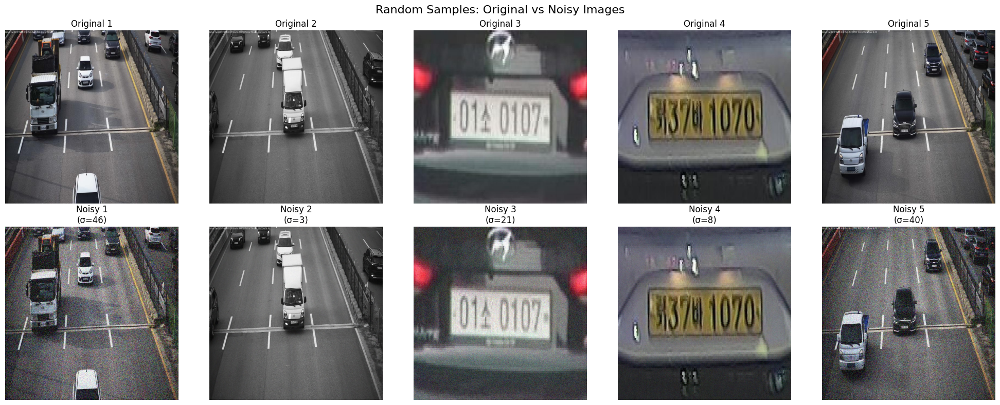

In [31]:
# 결과 확인 (여러 샘플)
n_samples = 5
train_files = os.listdir(os.path.join(img_path, 'train'))
sample_files = random.sample(train_files, n_samples)

plt.figure(figsize=(20, 8))
for idx, sample_file in enumerate(sample_files):
    # 원본 이미지
    original = cv2.imread(os.path.join(img_path, 'train', sample_file))
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # 노이즈가 적용된 이미지
    noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_file))
    noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
    # 해당 이미지의 시그마값 가져오기
    sigma = sigma_values['train'][sample_file]

    # 원본 이미지 표시
    plt.subplot(2, n_samples, idx + 1)
    plt.imshow(original)
    plt.title(f'Original {idx+1}')
    plt.axis('off')
    
    # 노이즈 적용된 이미지 표시
    plt.subplot(2, n_samples, n_samples + idx + 1)
    plt.imshow(noisy)
    plt.title(f'Noisy {idx+1}\n(σ={sigma})')
    plt.axis('off')

plt.suptitle('Random Samples: Original vs Noisy Images', fontsize=16)
plt.tight_layout()
plt.show()

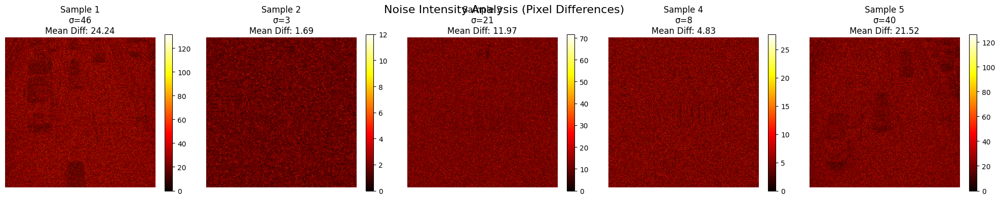

In [32]:
# 픽셀값 차이 분석
plt.figure(figsize=(20, 4))
for idx, sample_file in enumerate(sample_files):
    # 원본과 노이즈 이미지 로드
    original = cv2.imread(os.path.join(img_path, 'train', sample_file))
    noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_file))
    
    # 픽셀값 차이 계산
    diff = np.abs(original.astype(np.float32) - noisy.astype(np.float32))  # 절대값 차이
    diff_mean = np.mean(diff)  # 평균 차이
    
    # 해당 이미지의 시그마값 가져오기
    sigma = sigma_values['train'][sample_file]
    
    # 차이 시각화
    plt.subplot(1, n_samples, idx + 1)
    plt.imshow(diff.mean(axis=2), cmap='hot')  # RGB 채널의 평균 차이를 히트맵으로 표시
    plt.colorbar()
    plt.title(f'Sample {idx+1}\nσ={sigma}\nMean Diff: {diff_mean:.2f}')
    plt.axis('off')

plt.suptitle('Noise Intensity Analysis (Pixel Differences)', fontsize=16)
plt.tight_layout()
plt.show()

## 드리프트 분석
evidently 라이브러리를 활용한 데이터 드리프트 분석 결과 시각화
>identical visualize projection & vector encoding

In [3]:
import fiftyone as fo

fo.list_datasets()

['noised_cur',
 'noised_test',
 'noisedata_merged',
 'tunelpdr_merged',
 'tunelpdr_merged_all']

In [4]:
dataset = fo.load_dataset("noisedata_merged")

dataset

Name:        noisedata_merged
Media type:  image
Num samples: 38376
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField
    clip_embeddings:  fiftyone.core.fields.ListField(fiftyone.core.fields.FloatField)

In [5]:
dataset.first().source

'ref'

In [6]:
dataset.first()['clip_embeddings']

[-0.16796875,
 -0.5458984375,
 0.01401519775390625,
 0.0887451171875,
 -0.2265625,
 -0.35107421875,
 0.1907958984375,
 0.7919921875,
 0.2259521484375,
 -0.1925048828125,
 0.310791015625,
 -0.01157379150390625,
 -0.06573486328125,
 0.284912109375,
 -0.361328125,
 -0.305908203125,
 -0.50341796875,
 -0.046356201171875,
 0.2213134765625,
 -0.1453857421875,
 0.035858154296875,
 0.344482421875,
 -0.00182342529296875,
 0.1048583984375,
 -0.08221435546875,
 -0.11590576171875,
 -0.1595458984375,
 -0.404052734375,
 0.440185546875,
 -0.08111572265625,
 0.3642578125,
 -0.02398681640625,
 -0.08966064453125,
 -0.3193359375,
 -0.349853515625,
 -0.1917724609375,
 0.3037109375,
 0.11138916015625,
 0.80322265625,
 0.92431640625,
 -0.0288238525390625,
 -0.2108154296875,
 -0.51806640625,
 -0.06768798828125,
 0.10906982421875,
 -0.0323486328125,
 0.319091796875,
 0.414794921875,
 0.35498046875,
 -0.310546875,
 0.12548828125,
 0.06976318359375,
 0.08294677734375,
 -0.20703125,
 -0.298095703125,
 -0.39477539

In [7]:
import pandas as pd

# 소스별 데이터 분리
source_groups = {}
for sample in dataset:
    source = sample.source
    if source not in source_groups:
        source_groups[source] = []
    source_groups[source].append(sample['clip_embeddings'])

# 소스별 데이터프레임 생성
dfs = {}
for source, embeddings in source_groups.items():
    dfs[source] = pd.DataFrame(embeddings)

print(len(dfs['ref']))
dfs['ref'].head()

12792


,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,-0.167969,-0.545898,0.014015,0.088745,-0.226562,-0.351074,0.190796,0.791992,0.225952,-0.192505,...,0.331055,-0.268555,0.162720,0.023056,-0.092651,1.116211,0.593262,0.167358,0.312500,0.420166
1,-0.009804,-0.280518,-0.079468,0.163086,-0.039246,0.160278,0.280518,0.666504,0.009735,0.073853,...,-0.087097,0.123779,-0.030136,0.472900,-0.287109,0.149536,0.391357,0.015945,0.035370,0.321533
2,-0.105042,-0.468994,-0.200684,0.049408,-0.105042,-0.144653,-0.249634,0.556641,0.030273,0.039276,...,-0.212646,0.117310,-0.430420,-0.222046,-0.222290,0.412354,0.293457,-0.013748,0.130737,0.013054
3,-0.180786,-0.568359,-0.304932,0.589844,0.061859,0.172607,-0.144409,0.515137,0.093018,-0.097595,...,-0.139893,0.175171,0.091125,0.709473,0.075012,0.583984,0.255371,0.250488,0.014984,0.193359
4,-0.318359,-0.615234,-0.279785,0.522461,0.026978,0.171631,-0.225098,0.626465,0.057861,-0.132080,...,-0.155884,0.141846,0.082581,0.662598,-0.000957,0.659180,0.253662,0.304199,0.042023,0.167358


In [8]:
print(len(dfs['cur']))
dfs['cur'].head()

12792


,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,-0.231689,-0.692383,-0.076599,0.205811,-0.103943,-0.130127,0.037659,0.960938,0.007767,-0.161377,...,0.375732,-0.280029,0.251221,0.082520,-0.084412,1.074219,0.509766,0.164429,0.272705,0.501953
1,-0.052185,-0.489502,-0.251465,0.213013,0.036652,0.215210,0.165039,0.644043,-0.027451,0.063660,...,-0.262939,0.222900,0.041290,0.762207,-0.349609,0.409424,0.321533,-0.048828,-0.092590,0.367432
2,0.152222,-0.494873,-0.225220,-0.044922,-0.153076,0.008919,-0.189697,0.201416,0.237305,-0.223511,...,-0.117493,0.182983,-0.300293,0.104553,-0.219604,0.636230,0.226196,-0.003796,0.197144,-0.052887
3,-0.237061,-0.667969,-0.258057,0.554688,0.141968,0.311523,-0.313477,0.743652,-0.041229,-0.261230,...,-0.213013,0.227539,0.326172,0.828613,-0.110413,0.363770,0.393799,0.240479,-0.071228,0.122009
4,-0.254395,-0.776367,-0.289062,0.434814,0.076111,0.334229,-0.302979,0.732910,0.018631,-0.381592,...,-0.190430,0.211670,0.328613,0.791504,-0.119019,0.531738,0.388184,0.219116,-0.011543,0.134155


In [9]:
print(len(dfs['test']))
dfs['test'].head()

12792


,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,-0.342773,-0.649902,-0.095886,0.246094,-0.170532,0.052368,-0.100098,0.884277,0.070129,-0.138672,...,0.140991,-0.481934,0.406982,-0.164062,-0.138794,1.072266,0.352051,0.214966,0.308105,0.464844
1,-0.052612,-0.443848,-0.182617,0.239014,0.013458,0.242310,0.208130,0.670410,0.011086,0.058868,...,-0.276123,0.244873,0.084229,0.838867,-0.359375,0.261230,0.330811,-0.096130,-0.107727,0.350830
2,0.085083,-0.622070,-0.190430,-0.011795,-0.229980,0.052063,-0.192749,0.147827,0.306152,-0.222046,...,-0.111084,0.134766,-0.212524,0.137329,-0.267578,0.521973,0.228760,0.001533,0.240479,-0.145020
3,-0.200073,-0.694336,-0.407959,0.512207,0.106323,0.340088,-0.257568,0.672852,-0.013054,-0.347900,...,-0.162476,0.214233,0.249756,0.706055,-0.137939,0.405029,0.366699,0.250244,-0.015099,0.061066
4,-0.190796,-0.811035,-0.397461,0.476562,0.063599,0.207153,-0.352051,0.716309,0.017029,-0.416992,...,-0.249756,0.096436,0.249878,0.873535,-0.250732,0.547363,0.516113,0.198120,0.077881,0.145874


In [10]:
# 프로젝션 설정을 위한 column 이름 생성
column_names = [f'feature_{i}' for i in range(512)]

# 데이터프레임 컬럼명 설정
for source in dfs:
    dfs[source].columns = column_names

dfs['ref'].head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_502,feature_503,feature_504,feature_505,feature_506,feature_507,feature_508,feature_509,feature_510,feature_511
0,-0.167969,-0.545898,0.014015,0.088745,-0.226562,-0.351074,0.190796,0.791992,0.225952,-0.192505,...,0.331055,-0.268555,0.162720,0.023056,-0.092651,1.116211,0.593262,0.167358,0.312500,0.420166
1,-0.009804,-0.280518,-0.079468,0.163086,-0.039246,0.160278,0.280518,0.666504,0.009735,0.073853,...,-0.087097,0.123779,-0.030136,0.472900,-0.287109,0.149536,0.391357,0.015945,0.035370,0.321533
2,-0.105042,-0.468994,-0.200684,0.049408,-0.105042,-0.144653,-0.249634,0.556641,0.030273,0.039276,...,-0.212646,0.117310,-0.430420,-0.222046,-0.222290,0.412354,0.293457,-0.013748,0.130737,0.013054
3,-0.180786,-0.568359,-0.304932,0.589844,0.061859,0.172607,-0.144409,0.515137,0.093018,-0.097595,...,-0.139893,0.175171,0.091125,0.709473,0.075012,0.583984,0.255371,0.250488,0.014984,0.193359
4,-0.318359,-0.615234,-0.279785,0.522461,0.026978,0.171631,-0.225098,0.626465,0.057861,-0.132080,...,-0.155884,0.141846,0.082581,0.662598,-0.000957,0.659180,0.253662,0.304199,0.042023,0.167358


In [11]:
import pandas as pd
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metrics import EmbeddingsDriftMetric
from evidently.metrics.data_drift.embedding_drift_methods import mmd
from evidently.metric_preset import DataDriftPreset
from sklearn.decomposition import PCA

# 컬럼 매핑 설정
column_mapping = ColumnMapping(
    embeddings={'full': dfs['ref'].columns.tolist()},
    target=None
)

In [13]:
drift_metric = EmbeddingsDriftMetric(
    'full',
    drift_method=mmd(
        threshold=0.015,
        pca_components=None,
    )
)

In [14]:
report = Report(metrics=[drift_metric])

In [15]:
report.run(
    reference_data=dfs['test'],
    current_data=dfs['ref'],
    column_mapping=column_mapping
)
report.show(mode='inline')

In [16]:
report.run(
    reference_data=dfs['test'],
    current_data=dfs['cur'],
    column_mapping=column_mapping
)
report.show(mode='inline')

In [ ]:
import matplotlib.font_manager as font_manager
# 시스템에 설치된 ttf 폰트 전체 리스트
font_list_system = font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
print( [f.name for f in font_manager.fontManager.ttflist] )


['DejaVu Sans', 'STIXGeneral', 'DejaVu Sans Display', 'STIXGeneral', 'DejaVu Sans Mono', 'STIXNonUnicode', 'DejaVu Sans', 'STIXSizeThreeSym', 'STIXNonUnicode', 'DejaVu Serif', 'STIXSizeFiveSym', 'STIXGeneral', 'cmsy10', 'STIXSizeThreeSym', 'DejaVu Serif Display', 'DejaVu Serif', 'STIXSizeFourSym', 'DejaVu Sans', 'DejaVu Serif', 'cmtt10', 'STIXNonUnicode', 'cmss10', 'STIXSizeTwoSym', 'STIXSizeOneSym', 'STIXSizeTwoSym', 'cmex10', 'STIXGeneral', 'DejaVu Sans Mono', 'DejaVu Serif', 'STIXSizeOneSym', 'cmmi10', 'cmr10', 'cmb10', 'DejaVu Sans', 'STIXNonUnicode', 'STIXSizeFourSym', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'Ubuntu Mono', 'Ubuntu', 'Ubuntu', 'Ubuntu Sans Mono', 'Ubuntu', 'Ubuntu', 'Ubuntu', 'DejaVu Sans Mono', 'DejaVu Sans', 'DejaVu Serif', 'Ubuntu Sans', 'Ubuntu', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'Ubuntu Mono', 'Ubuntu', 'Ubuntu', 'Ubuntu', 'Ubuntu', 'Ubuntu', 'Ubuntu Mono', 'Ubuntu Mono', 'Ubuntu Mono', 'Ubuntu', 'DejaVu Serif', 'Ubuntu Sans', 'Ubuntu

In [ ]:
# ttflist를 추가
for f in font_list_system:
    font_manager.FontManager.addfont( font_manager.fontManager, f)
# 설치 확인
print( [f.name for f in font_manager.fontManager.ttflist] )
# 폰트 지정
plt.rc('font', family='NanumGothic')

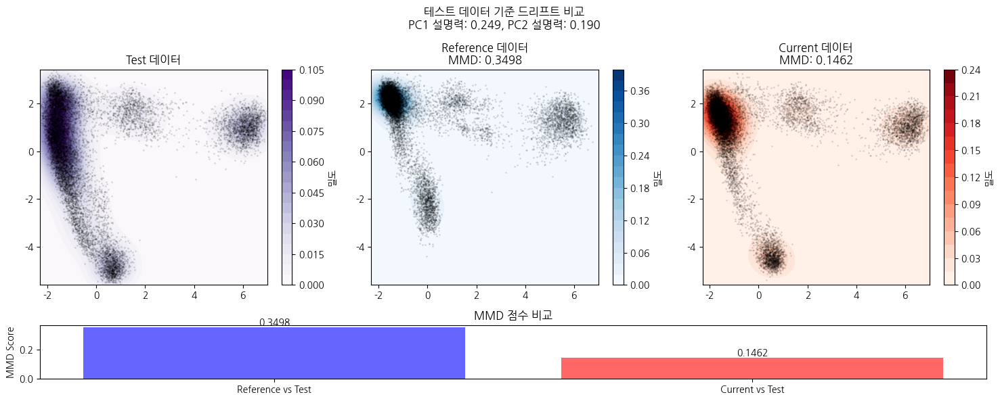

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.stats import gaussian_kde

def calculate_mmd_batch(X, Y, batch_size=1000, gamma=None):
    """
    배치 처리를 통한 MMD 계산
    """
    # 배치 크기 조정
    batch_size = min(batch_size, min(len(X), len(Y)))
    
    # 랜덤 샘플링
    if len(X) > batch_size:
        idx = np.random.choice(len(X), batch_size, replace=False)
        X = X[idx]
    if len(Y) > batch_size:
        idx = np.random.choice(len(Y), batch_size, replace=False)
        Y = Y[idx]
    
    if gamma is None:
        # 중간값 휴리스틱 사용 (배치 데이터 기준)
        X_combined = np.vstack([X[:batch_size], Y[:batch_size]])
        pairwise_dists = np.sum((X_combined[:, np.newaxis] - X_combined) ** 2, axis=2)
        gamma = 1.0 / np.median(pairwise_dists[pairwise_dists > 0])

    def kernel(X, Y):
        # RBF 커널
        X_norm = np.sum(X ** 2, axis=1)
        Y_norm = np.sum(Y ** 2, axis=1)
        distances = X_norm[:, np.newaxis] + Y_norm - 2 * np.dot(X, Y.T)
        return np.exp(-gamma * distances)

    K_XX = kernel(X, X)
    K_YY = kernel(Y, Y)
    K_XY = kernel(X, Y)

    n_X = X.shape[0]
    n_Y = Y.shape[0]

    mmd = (np.sum(K_XX) - np.trace(K_XX)) / (n_X * (n_X - 1))
    mmd += (np.sum(K_YY) - np.trace(K_YY)) / (n_Y * (n_Y - 1))
    mmd -= 2 * np.mean(K_XY)

    return np.sqrt(max(mmd, 0))

def visualize_fixed_projection_drift(ref_data, cur_data, test_data, title="임베딩 드리프트 비교"):
    """
    고정된 프로젝션으로 드리프트 시각화
    """
    # 1. MMD 점수 계산
    ref_mmd = calculate_mmd_batch(test_data, ref_data, batch_size=1000)
    cur_mmd = calculate_mmd_batch(test_data, cur_data, batch_size=1000)
    
    # 2. PCA 및 시각화
    pca = PCA(n_components=2)
    pca.fit(test_data)
    
    test_transformed = pca.transform(test_data)
    ref_transformed = pca.transform(ref_data)
    cur_transformed = pca.transform(cur_data)
    
    all_transformed = np.vstack([test_transformed, ref_transformed, cur_transformed])
    x_min, x_max = all_transformed[:, 0].min(), all_transformed[:, 0].max()
    y_min, y_max = all_transformed[:, 1].min(), all_transformed[:, 1].max()
    xx, yy = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    
    def calculate_density(data):
        kde = gaussian_kde(data.T)
        z = kde(positions).reshape(xx.shape)
        return z
    
    test_density = calculate_density(test_transformed)
    ref_density = calculate_density(ref_transformed)
    cur_density = calculate_density(cur_transformed)
    
    # 3. 시각화
    fig = plt.figure(figsize=(15, 6))  # 높이 약간 증가
    
    # 서브플롯 그리드 설정 (상단: 등고선, 하단: MMD 점수)
    gs = plt.GridSpec(2, 3, height_ratios=[4, 1])
    
    # 등고선 그래프
    cmaps = ['Purples', 'Blues', 'Reds']
    titles = ['Test 데이터', 'Reference 데이터\nMMD: {:.4f}'.format(ref_mmd), 
             'Current 데이터\nMMD: {:.4f}'.format(cur_mmd)]
    densities = [test_density, ref_density, cur_density]
    transformed_data = [test_transformed, ref_transformed, cur_transformed]
    
    for idx, (density, data, cmap, subtitle) in enumerate(zip(densities, transformed_data, 
                                                            cmaps, titles)):
        ax = plt.subplot(gs[0, idx])
        contour = ax.contourf(xx, yy, density, levels=20, cmap=cmap)
        ax.scatter(data[:, 0], data[:, 1], c='black', alpha=0.1, s=1)
        plt.colorbar(contour, ax=ax, label='밀도')
        ax.set_title(subtitle)
    
    # MMD 점수 바 그래프
    ax_mmd = plt.subplot(gs[1, :])
    bars = ax_mmd.bar(['Reference vs Test', 'Current vs Test'], 
                     [ref_mmd, cur_mmd],
                     color=['blue', 'red'], alpha=0.6)
    ax_mmd.set_title('MMD 점수 비교')
    ax_mmd.set_ylabel('MMD Score')
    
    # 바 위에 값 표시
    for bar in bars:
        height = bar.get_height()
        ax_mmd.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.4f}',
                   ha='center', va='bottom')
    
    # 전체 제목
    plt.suptitle(f'{title}\nPC1 설명력: {pca.explained_variance_ratio_[0]:.3f}, '
                f'PC2 설명력: {pca.explained_variance_ratio_[1]:.3f}')
    plt.tight_layout()
    
    return fig

# 시각화 실행
fig = visualize_fixed_projection_drift(
    dfs['ref'].values, dfs['cur'].values, dfs['test'].values,
    "테스트 데이터 기준 드리프트 비교"
)
plt.show()